In [1]:
# Data analysis and Manipulation 
import plotly.graph_objs as go 
import plotly.io as pio 
import plotly.express as px 
import pandas as pd 
import seaborn as sns
  
# Data Visualization 
import matplotlib.pyplot as plt 
  
# Importing Plotly 
import plotly.offline as py 
py.init_notebook_mode(connected=True) 
  
# Initializing Plotly 
pio.renderers.default = 'colab'

In [2]:
df = pd.read_csv(r'C:\Users\parha\Documents\Data_Analysis_projects\Covid\covid.csv')

In [3]:
df.head(2)

,Country/Region,Continent,Population,TotalCases,NewCases,TotalDeaths,NewDeaths,TotalRecovered,NewRecovered,ActiveCases,"Serious,Critical",Tot Cases/1M pop,Deaths/1M pop,TotalTests,Tests/1M pop,WHO Region,iso_alpha
0,USA,North America,331198130.0,5032179,NaN,162804.0,NaN,2576668.0,NaN,2292707.0,18296.0,15194.0,492.0,63139605.0,190640.0,Americas,USA
1,Brazil,South America,212710692.0,2917562,NaN,98644.0,NaN,2047660.0,NaN,771258.0,8318.0,13716.0,464.0,13206188.0,62085.0,Americas,BRA


In [4]:
def check_detail(dataframe):
    d = {'SHAPE': dataframe.shape,
        'COLUMNS': dataframe.columns,
        'INDEX': dataframe.index,
        'VALUE TYPES': dataframe.dtypes,
        'DUPLICATED VALUES': dataframe.duplicated().sum(),
        'NUMBER OF UNIQUE VALUES': dataframe.nunique(),
        'ANY MISSING VALUES': dataframe.isnull().values.any(),
        'MISSING VALUES': dataframe.isnull().sum(),
        'DESCRIBE.T': dataframe.describe([0, 0.05, 0.50, 0.95, 0.99, 1]).T}
    hashtags = '---------------------------'
    for key, val in d.items():
        print(f'{hashtags} {key} {hashtags}')
        print(val)
    print(f'{hashtags} {"LIST END"} {hashtags}')
   

check_detail(dataframe=df)

--------------------------- SHAPE ---------------------------
(209, 17)
--------------------------- COLUMNS ---------------------------
Index(['Country/Region', 'Continent', 'Population', 'TotalCases', 'NewCases',
       'TotalDeaths', 'NewDeaths', 'TotalRecovered', 'NewRecovered',
       'ActiveCases', 'Serious,Critical', 'Tot Cases/1M pop', 'Deaths/1M pop',
       'TotalTests', 'Tests/1M pop', 'WHO Region', 'iso_alpha'],
      dtype='object')
--------------------------- INDEX ---------------------------
RangeIndex(start=0, stop=209, step=1)
--------------------------- VALUE TYPES ---------------------------
Country/Region       object
Continent            object
Population          float64
TotalCases            int64
NewCases            float64
TotalDeaths         float64
NewDeaths           float64
TotalRecovered      float64
NewRecovered        float64
ActiveCases         float64
Serious,Critical    float64
Tot Cases/1M pop    float64
Deaths/1M pop       float64
TotalTests         

We don’t need ‘NewCases’, ‘NewDeaths’, ‘NewRecovered’ columns as they contains NaN values. So drop these columns by drop() function of pandas.

In [5]:
df = df.drop(['NewCases', 'NewDeaths', 'NewRecovered'],axis=1)

In [6]:
df.head(1)

,Country/Region,Continent,Population,TotalCases,TotalDeaths,TotalRecovered,ActiveCases,"Serious,Critical",Tot Cases/1M pop,Deaths/1M pop,TotalTests,Tests/1M pop,WHO Region,iso_alpha
0,USA,North America,331198130.0,5032179,162804.0,2576668.0,2292707.0,18296.0,15194.0,492.0,63139605.0,190640.0,Americas,USA


In [7]:
total_case = df.groupby('Country/Region')['TotalCases'].value_counts().reset_index().sort_values(by='TotalCases',ascending=False)

In [8]:
total_case = total_case.drop('count',axis=1)

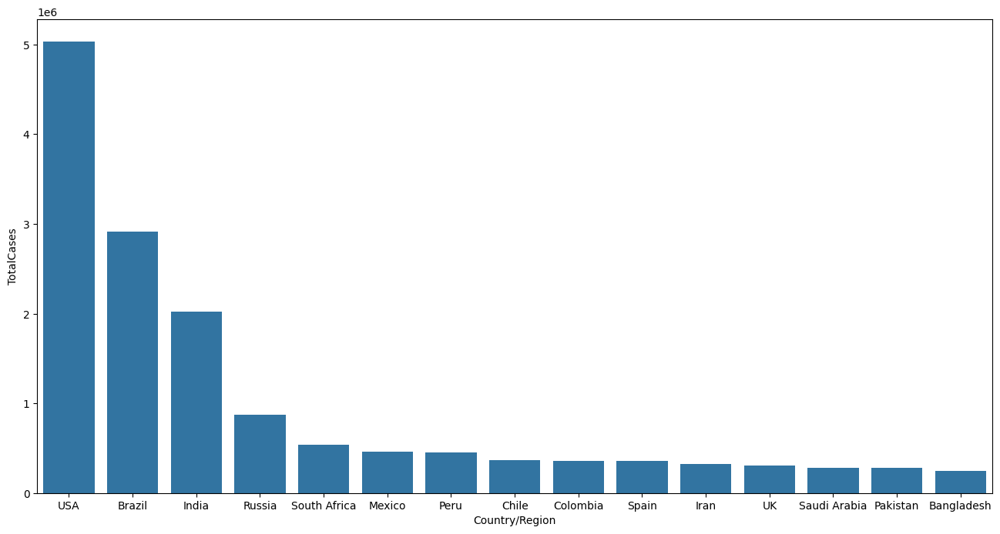

In [9]:
plt.figure(figsize=(16,8))
sns.barplot(data=total_case.head(15), x='Country/Region',y='TotalCases')
plt.show()

In [16]:
import plotly.offline as pyo
pyo.init_notebook_mode(connected=True)

px.bar(df.head(15), x = 'Country/Region', 
	y = 'TotalCases',color = 'TotalCases', 
	height = 500,hover_data = ['Country/Region', 'Continent'])


In [17]:
px.bar(df.head(15), x = 'Country/Region', 
	y = 'TotalTests',color = 'TotalTests', 
	height = 500,hover_data = ['Country/Region', 'Continent'])

In [18]:
pyo.init_notebook_mode(connected=True)
px.bar(df.head(15), x = 'Continent', 
	y = 'TotalTests',color = 'TotalTests', 
	height = 500,hover_data = ['Country/Region', 'Continent'])

Step 5: Data Visualization through Bubble Charts-Continent Wise
Let’s create a scatter plot and take a look at the continent’s statistics, firstly look at the total number of cases by continent and take hover data as ‘Country/Region’, ‘Continent’.

In [19]:

px.scatter(df, x='Continent',y='TotalCases',  
           hover_data=['Country/Region', 'Continent'],  
           color='TotalCases', size='TotalCases', size_max=80)

In [21]:

px.scatter(df.head(57), x='Continent',y='TotalCases',  
           hover_data=['Country/Region', 'Continent'],  
           color='TotalCases', size='TotalCases', size_max=80, log_y=True)

Visualization of Data in terms of Maps\
We can use choropleth to visualize the data in terms of maps, with maps usually being the predominant way of visualizing the data. Since COVID-19 is a global phenomenon and so we look through and fix them in terms of wall maps. Ortho-graphics, rectangular and natural earth projection to visualize the data With dataset2 for the purpose as it has Dates column. It will look at the growth of Covid-19 (from Jan to July 2020) as in how the virus reached across the world.

Choropleth is an amazing representation of data on a map. Choropleth maps provide an easy way to visualize how a measurement varies across a geographic areal-Life

Project Application in Real choropleth map displays divided geographical areas or regions that are colored, shaded or patterned in relation to a data variable.

In [13]:
df2 = pd.read_csv(r'C:\Users\parha\Documents\Data_Analysis_projects\Covid\covid_grouped.csv')

In [22]:
px.choropleth(df2, 
			locations="iso_alpha", 
			color="Confirmed", 
			hover_name="Country/Region", 
			color_continuous_scale="Blues", 
			animation_frame="Date")


In [24]:

px.choropleth(df2, 
              locations='iso_alpha', 
              color="Recovered", 
              hover_name="Country/Region", 
              color_continuous_scale="RdYlGn", 
              projection="natural earth", 
              animation_frame="Date" )

In [26]:
px.bar(df2, x="WHO Region", y="Confirmed", color="WHO Region",  
       animation_frame="Date", hover_name="Country/Region")

In [25]:
df2.head(1)

,Date,Country/Region,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,WHO Region,iso_alpha
0,2020-01-22,Afghanistan,0,0,0,0,0,0,0,Eastern Mediterranean,AFG


 Visualize text using Word Cloud
 
Visualize the causes of death due to covid-19, as covid-19 affects people in different ways, hence creating a word cloud to visualize the leading cause of covid-19 deaths. To visualize the text the steps need to be followed are:

Used to convert data elements of an array into list.
Convert the string to one single string.
Convert the string into word cloud

In [27]:
df3 = pd.read_csv(r'C:\Users\parha\Documents\Data_Analysis_projects\Covid\coviddeath.csv')

In [31]:
df3.head(1)

,Data as of,Start Week,End Week,State,Condition Group,Condition,ICD10_codes,Age Group,Number of COVID-19 Deaths,Flag
0,08/30/2020,02/01/2020,08/29/2020,US,Respiratory diseases,Influenza and pneumonia,J09-J18,0-24,122.0,NaN


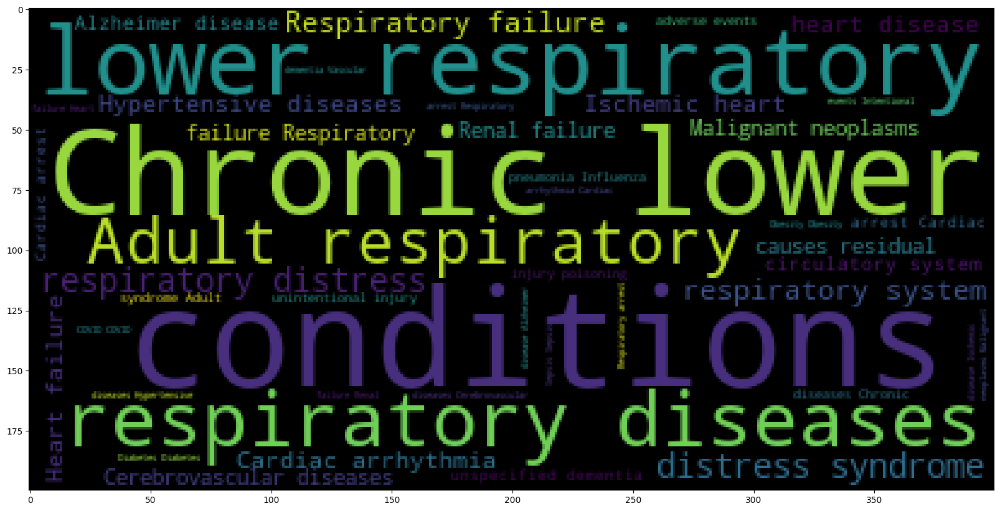

In [32]:
# import word cloud 
from wordcloud import WordCloud 

sentences = df3["Condition"].tolist() 
sentences_as_a_string = ' '.join(sentences) 


# Convert the string into WordCloud 
plt.figure(figsize=(20, 20)) 
plt.imshow(WordCloud().generate(sentences_as_a_string)) 
